In [1]:
import pandas as pd
import numpy as np
import sys
import keras
import tensorflow as tf
import matplotlib.pyplot as plt
from keras.utils import to_categorical
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Dense, Flatten
from keras.optimizers import Adam
from keras.preprocessing.image import ImageDataGenerator
import time
import random
np.random.seed(42)
random.seed(42)
tf.random.set_seed(42)

ImportError: cannot import name 'ImageDataGenerator' from 'keras.preprocessing.image' (C:\Users\Manoj\AppData\Roaming\Python\Python310\site-packages\keras\api\preprocessing\image\__init__.py)

In [ ]:
models=["VGG(1 block)","VGG(3 blocks)","VGG(3 blocks) with augmentation","VGG16(MLP layers)","VGG16(all layers)"]

In [ ]:
data={
    "Training Time":[0]*5,"Training Loss":[0]*5,"Training Accuracy":[0]*5,"Testing Accuracy":[0]*5,"Model parameters":[0]*5
}

In [ ]:
# define cnn model VGG block 1
def define_model():
	model = Sequential()
	model.add(Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same', input_shape=(200, 200, 3)))
	model.add(MaxPooling2D((2, 2)))
	model.add(Flatten())
	model.add(Dense(128, activation='relu', kernel_initializer='he_uniform'))
	model.add(Dense(1, activation='sigmoid'))
	# compile model
	opt = Adam(learning_rate=0.001)
	model.compile(optimizer=opt, loss='binary_crossentropy', metrics=['accuracy'])
	return model

In [ ]:
# define cnn model VGG block 3
def define_model_1():
	model = Sequential()
	model.add(Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same', input_shape=(200, 200, 3)))
	model.add(MaxPooling2D((2, 2)))
	model.add(Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
	model.add(MaxPooling2D((2, 2)))
	model.add(Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
	model.add(MaxPooling2D((2, 2)))
	model.add(Flatten())
	model.add(Dense(128, activation='relu', kernel_initializer='he_uniform'))
	model.add(Dense(1, activation='sigmoid'))
	# compile model
	opt = Adam(learning_rate=0.001)
	model.compile(optimizer=opt, loss='binary_crossentropy', metrics=['accuracy'])
	return model

In [ ]:
def summarize_diagnostics(history,ind):
    # Plot loss
    plt.figure(figsize=(10, 5))
    plt.subplot(211)
    plt.title('Cross Entropy Loss')
    plt.plot(history.history['loss'], color='blue', label='train')
    plt.plot(history.history['val_loss'], color='orange', label='test')
    plt.legend()

    # Plot accuracy
    plt.subplot(212)
    plt.title('Classification Accuracy')
    plt.plot(history.history['accuracy'], color='blue', label='train')
    plt.plot(history.history['val_accuracy'], color='orange', label='test')
    plt.legend()

    # Save plot to file
    plt.tight_layout()
    filename = f"model{ind}.png"  # Set a specific name for clarity
    plt.savefig(filename)
    print(f"Plot saved as {filename}")
    plt.close()


# Run the test harness for evaluating a model
def run_test_harness(m,ind):
    # Define model
    model = m()
    # Create data generator
    datagen = ImageDataGenerator(rescale=1.0/255.0)
    # Prepare iterators
    train_it = datagen.flow_from_directory('dataset/train/',
                                           class_mode='binary', batch_size=64, target_size=(200, 200))
    
    test_it = datagen.flow_from_directory('dataset/test/',
                                          class_mode='binary', batch_size=64, target_size=(200, 200))
    # Fit model
    start_time = time.time()
    history = model.fit(train_it, steps_per_epoch=len(train_it),
                    validation_data=test_it, validation_steps=len(test_it),
                    epochs=5, batch_size=32, verbose=1)
    end_time=time.time()
    model_filename = f"model_{ind+1}.h5"
    model.save(model_filename)
    data["Training Time"][ind]=(end_time-start_time)
    data["Training Accuracy"][ind]=np.mean(history.history['accuracy'])*100
    data["Training Loss"][ind]=np.mean(history.history['loss'])
    data["Model parameters"][ind]=model.count_params()
    # Evaluate model
    _, acc = model.evaluate(test_it, steps=len(test_it), verbose=0)
    print(f'> Accuracy: {acc * 100.0:.3f}%')
    data["Testing Accuracy"][ind]=acc*100
    # Learning curves
    summarize_diagnostics(history,ind)

# Entry point, run the test harness

run_test_harness(define_model,0)

Found 160 images belonging to 2 classes.
Found 40 images belonging to 2 classes.
Epoch 1/5
3/3 [==============================] - 5s 1s/step - loss: 104.2364 - accuracy: 0.4250 - val_loss: 36.5525 - val_accuracy: 0.5000
Epoch 2/5
3/3 [==============================] - 4s 1s/step - loss: 44.2711 - accuracy: 0.5125 - val_loss: 2.9853 - val_accuracy: 0.8500
Epoch 3/5
3/3 [==============================] - 4s 2s/step - loss: 10.8202 - accuracy: 0.8062 - val_loss: 28.6904 - val_accuracy: 0.6250
Epoch 4/5
3/3 [==============================] - 4s 2s/step - loss: 10.0612 - accuracy: 0.8125 - val_loss: 0.6088 - val_accuracy: 0.9500
Epoch 5/5
3/3 [==============================] - 5s 2s/step - loss: 2.7755 - accuracy: 0.8813 - val_loss: 4.3420 - val_accuracy: 0.8500


c:\Users\Saharsh\anaconda3\envs\myenv\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


> Accuracy: 85.000%
Plot saved as model0.png


In [ ]:
print(data)

{'Training Time': [23.607911586761475, 32.811476945877075, 40.395782470703125, 169.74115419387817, 431.0836524963379], 'Training Loss': [34.43288831710815, 9.889673012495042, 5.523207283020019, 11.736049729585648, 15.356673765182496], 'Training Accuracy': [68.75, 66.49999976158142, 78.75000059604645, 79.75000143051147, 55.12500047683716], 'Testing Accuracy': [85.00000238418579, 75.0, 89.99999761581421, 75.0, 50.0], 'Model parameters': [40961153, 10333505, 10333505, 17926209, 17926209]}


In [ ]:
run_test_harness(define_model_1,1)

Found 160 images belonging to 2 classes.
Found 40 images belonging to 2 classes.
Epoch 1/5
3/3 [==============================] - 7s 2s/step - loss: 24.9786 - accuracy: 0.6187 - val_loss: 15.3781 - val_accuracy: 0.5000
Epoch 2/5
3/3 [==============================] - 6s 2s/step - loss: 13.8099 - accuracy: 0.5000 - val_loss: 1.1306 - val_accuracy: 0.5000
Epoch 3/5
3/3 [==============================] - 5s 2s/step - loss: 1.3043 - accuracy: 0.4875 - val_loss: 0.3197 - val_accuracy: 0.8750
Epoch 4/5
3/3 [==============================] - 5s 2s/step - loss: 0.3183 - accuracy: 0.8875 - val_loss: 0.3603 - val_accuracy: 0.8500
Epoch 5/5
3/3 [==============================] - 6s 2s/step - loss: 0.1714 - accuracy: 0.9312 - val_loss: 0.2877 - val_accuracy: 0.8750
> Accuracy: 87.500%
Plot saved as model1.png


In [ ]:
print(data)

{'Training Time': [23.607911586761475, 29.216400146484375, 40.395782470703125, 169.74115419387817, 431.0836524963379], 'Training Loss': [34.43288831710815, 8.116499817371368, 5.523207283020019, 11.736049729585648, 15.356673765182496], 'Training Accuracy': [68.75, 68.49999904632568, 78.75000059604645, 79.75000143051147, 55.12500047683716], 'Testing Accuracy': [85.00000238418579, 87.5, 89.99999761581421, 75.0, 50.0], 'Model parameters': [40961153, 10333505, 10333505, 17926209, 17926209]}


In [ ]:
def run_test_harness_aug(m,ind):
    # Define model
    model = m()
    # Create data generator
    train_datagen = ImageDataGenerator(rescale=1.0/255.0,width_shift_range=0.1, height_shift_range=0.1, horizontal_flip=True)
    test_datagen = ImageDataGenerator(rescale=1.0/255.0)
    # prepare iterators
    train_it = train_datagen.flow_from_directory('dataset/train/',class_mode='binary', batch_size=64, target_size=(200, 200))
    test_it = test_datagen.flow_from_directory('dataset/test/',class_mode='binary', batch_size=64, target_size=(200, 200))
    # Fit model
    start_time = time.time()
    history = model.fit(train_it, steps_per_epoch=len(train_it),
                    validation_data=test_it, validation_steps=len(test_it),
                    epochs=5, batch_size=32, verbose=1)
    end_time=time.time()
    model_filename = f"model_{ind+1}.h5"
    model.save(model_filename)
    data["Training Time"][ind]=(end_time-start_time)
    data["Training Accuracy"][ind]=np.mean(history.history['accuracy'])*100
    data["Training Loss"][ind]=np.mean(history.history['loss'])
    data["Model parameters"][ind]=model.count_params()
    # Evaluate model
    _, acc = model.evaluate(test_it, steps=len(test_it), verbose=0)
    print(f'> Accuracy: {acc * 100.0:.3f}%')
    data["Testing Accuracy"][ind]=acc*100
    # Learning curves
    summarize_diagnostics(history,ind)

# Entry point, run the test harness

run_test_harness_aug(define_model_1,2)

Found 160 images belonging to 2 classes.
Found 40 images belonging to 2 classes.
Epoch 1/5
3/3 [==============================] - 9s 3s/step - loss: 15.3528 - accuracy: 0.6375 - val_loss: 27.4851 - val_accuracy: 0.5000
Epoch 2/5
3/3 [==============================] - 8s 2s/step - loss: 10.1322 - accuracy: 0.6438 - val_loss: 2.4080 - val_accuracy: 0.7250
Epoch 3/5
3/3 [==============================] - 8s 3s/step - loss: 2.2526 - accuracy: 0.7563 - val_loss: 0.4121 - val_accuracy: 0.9000
Epoch 4/5
3/3 [==============================] - 9s 4s/step - loss: 0.8000 - accuracy: 0.8938 - val_loss: 2.6696 - val_accuracy: 0.7000
Epoch 5/5
3/3 [==============================] - 9s 3s/step - loss: 0.8554 - accuracy: 0.8500 - val_loss: 1.4707 - val_accuracy: 0.7000
> Accuracy: 70.000%
Plot saved as model2.png


In [ ]:
print(data)

{'Training Time': [23.607911586761475, 29.216400146484375, 44.59886860847473, 169.74115419387817, 431.0836524963379], 'Training Loss': [34.43288831710815, 8.116499817371368, 5.8786161065101625, 11.736049729585648, 15.356673765182496], 'Training Accuracy': [68.75, 68.49999904632568, 75.6250011920929, 79.75000143051147, 55.12500047683716], 'Testing Accuracy': [85.00000238418579, 87.5, 69.9999988079071, 75.0, 50.0], 'Model parameters': [40961153, 10333505, 10333505, 17926209, 17926209]}


In [ ]:
from keras.applications.vgg16 import VGG16
from keras.models import Model
def define_model_2(all):
	# load model
	model = VGG16(include_top=False, input_shape=(224, 224, 3))
	# mark loaded layers as not trainable
	for layer in model.layers:
		layer.trainable = all
	# add new classifier layers
	flat1 = Flatten()(model.layers[-1].output)
	class1 = Dense(128, activation='relu', kernel_initializer='he_uniform')(flat1)
	output = Dense(1, activation='sigmoid')(class1)
	# define new model
	model = Model(inputs=model.inputs, outputs=output)
	# compile model
	opt = Adam(learning_rate=0.001)
	model.compile(optimizer=opt, loss='binary_crossentropy', metrics=['accuracy'])
	return model
def run_test_harness(ind,all):
	# define model
	model = define_model_2(all)
	# create data generator
	datagen = ImageDataGenerator(featurewise_center=True)
	# specify imagenet mean values for centering
	datagen.mean = [123.68, 116.779, 103.939]
	# prepare iterator
	train_it = datagen.flow_from_directory('dataset/train/',
		class_mode='binary', batch_size=64, target_size=(224, 224))
	test_it = datagen.flow_from_directory('dataset/test/',
		class_mode='binary', batch_size=64, target_size=(224, 224))
	start_time=time.time()
	# fit model
	history = model.fit(train_it, steps_per_epoch=len(train_it),
		validation_data=test_it, validation_steps=len(test_it), epochs=5, verbose=1)
	# evaluate model
	end_time=time.time()
	model_filename = f"model_{ind+1}.h5"
	model.save(model_filename)
	data["Training Time"][ind]=end_time-start_time
	data["Training Accuracy"][ind]=np.mean(history.history['accuracy'])*100
	data["Training Loss"][ind]=np.mean(history.history['loss'])
	data["Model parameters"][ind]=model.count_params()
	_, acc = model.evaluate(test_it, steps=len(test_it), verbose=0)
	print('> %.3f' % (acc * 100.0))
	data["Testing Accuracy"][ind]=acc*100
	# learning curves
	summarize_diagnostics(history,ind)
 
# entry point, run the test harness
run_test_harness(3,False)

Found 160 images belonging to 2 classes.
Found 40 images belonging to 2 classes.
Epoch 1/5
3/3 [==============================] - 27s 9s/step - loss: 45.0454 - accuracy: 0.5562 - val_loss: 0.0617 - val_accuracy: 0.9750
Epoch 2/5
3/3 [==============================] - 25s 10s/step - loss: 1.6458 - accuracy: 0.9187 - val_loss: 6.2234 - val_accuracy: 0.7750
Epoch 3/5
3/3 [==============================] - 27s 9s/step - loss: 0.6224 - accuracy: 0.9438 - val_loss: 2.4425 - val_accuracy: 0.8750
Epoch 4/5
3/3 [==============================] - 26s 9s/step - loss: 0.0110 - accuracy: 0.9937 - val_loss: 0.7662 - val_accuracy: 0.9000
Epoch 5/5
3/3 [==============================] - 26s 11s/step - loss: 1.5334e-08 - accuracy: 1.0000 - val_loss: 0.0361 - val_accuracy: 1.0000
> 100.000
Plot saved as model3.png


In [ ]:
print(data)

{'Training Time': [23.607911586761475, 29.216400146484375, 44.59886860847473, 131.4650104045868, 431.0836524963379], 'Training Loss': [34.43288831710815, 8.116499817371368, 5.8786161065101625, 9.46493097571008, 15.356673765182496], 'Training Accuracy': [68.75, 68.49999904632568, 75.6250011920929, 88.24999928474426, 55.12500047683716], 'Testing Accuracy': [85.00000238418579, 87.5, 69.9999988079071, 100.0, 50.0], 'Model parameters': [40961153, 10333505, 10333505, 17926209, 17926209]}


In [ ]:
run_test_harness(4,True)

Found 160 images belonging to 2 classes.
Found 40 images belonging to 2 classes.
Epoch 1/5
3/3 [==============================] - 86s 34s/step - loss: 1417.8083 - accuracy: 0.5000 - val_loss: 134.9147 - val_accuracy: 0.5000
Epoch 2/5
3/3 [==============================] - 84s 26s/step - loss: 68.4351 - accuracy: 0.4750 - val_loss: 12.3728 - val_accuracy: 0.5000
Epoch 3/5
3/3 [==============================] - 85s 34s/step - loss: 7.7727 - accuracy: 0.4938 - val_loss: 5.5170 - val_accuracy: 0.5000
Epoch 4/5
3/3 [==============================] - 85s 26s/step - loss: 3.0309 - accuracy: 0.5063 - val_loss: 1.1782 - val_accuracy: 0.5000
Epoch 5/5
3/3 [==============================] - 80s 25s/step - loss: 0.9012 - accuracy: 0.5000 - val_loss: 0.8804 - val_accuracy: 0.4500
> 45.000
Plot saved as model4.png


In [ ]:
Table=pd.DataFrame(data,index=models)
display(Table)

,Training Time,Training Loss,Training Accuracy,Testing Accuracy,Model parameters
VGG(1 block),23.607912,34.432888,68.750000,85.000002,40961153
VGG(3 blocks),29.216400,8.116500,68.499999,87.500000,10333505
VGG(3 blocks) with augmentation,44.598869,5.878616,75.625001,69.999999,10333505
VGG16(MLP layers),131.465010,9.464931,88.249999,100.000000,17926209
VGG16(all layers),420.586187,299.589639,49.500000,44.999999,17926209


In [ ]:
from torch.utils.tensorboard import SummaryWriter
from keras.preprocessing.image import ImageDataGenerator

writer = SummaryWriter('runs/model1')

def run_test_harness(m):
    # Define model
    model = m()
    
    # Create data generator
    datagen = ImageDataGenerator(rescale=1.0/255.0)
    
    # Prepare iterators
    train_it = datagen.flow_from_directory('dataset/train/',
                                           class_mode='binary', batch_size=64, target_size=(200, 200))
    test_it = datagen.flow_from_directory('dataset/test/',
                                          class_mode='binary', batch_size=64, target_size=(200, 200))
    
    iteration = 0  # Track total iteration count across epochs
    
    for _ in range(5):  # Define number of epochs here
        for batch_x, batch_y in train_it:
            # Perform a single training step
            loss, accuracy = model.train_on_batch(batch_x, batch_y)
            
            # Log training loss and accuracy per iteration
            writer.add_scalar('Training Loss', loss, global_step=iteration)
            writer.add_scalar('Training Accuracy', accuracy, global_step=iteration)
            
            # Perform testing after each batch
            _, test_accuracy = model.evaluate(test_it, steps=len(test_it), verbose=0)
            writer.add_scalar('Testing Accuracy', test_accuracy, global_step=iteration)
            
            iteration += 1
            
            # Stop if we've completed all steps in the current epoch
            if iteration % len(train_it) == 0:
                break

    print("Training complete.")
    
# Entry point, run the test harness
run_test_harness(define_model)


Found 160 images belonging to 2 classes.
Found 40 images belonging to 2 classes.
Training complete.


In [ ]:
writer = SummaryWriter('runs/model2')
run_test_harness(define_model_1)

Found 160 images belonging to 2 classes.
Found 40 images belonging to 2 classes.
Training complete.


In [ ]:
writer = SummaryWriter('runs/model3')
def run_test_harness(m):
    # Define model
    model = m()
    train_datagen = ImageDataGenerator(rescale=1.0/255.0,width_shift_range=0.1, height_shift_range=0.1, horizontal_flip=True)
    test_datagen = ImageDataGenerator(rescale=1.0/255.0)
    # Prepare iterators
    train_it = train_datagen.flow_from_directory('dataset/train/',
                                           class_mode='binary', batch_size=64, target_size=(200, 200))
    test_it = test_datagen.flow_from_directory('dataset/test/',
                                          class_mode='binary', batch_size=64, target_size=(200, 200))
    
    iteration = 0  # Track total iteration count across epochs
    
    for _ in range(5):  # Define number of epochs here
        for batch_x, batch_y in train_it:
            # Perform a single training step
            loss, accuracy = model.train_on_batch(batch_x, batch_y)
            
            # Log training loss and accuracy per iteration
            writer.add_scalar('Training Loss', loss, global_step=iteration)
            writer.add_scalar('Training Accuracy', accuracy, global_step=iteration)
            
            # Perform testing after each batch
            _, test_accuracy = model.evaluate(test_it, steps=len(test_it), verbose=0)
            writer.add_scalar('Testing Accuracy', test_accuracy, global_step=iteration)
            
            iteration += 1
            
            # Stop if we've completed all steps in the current epoch
            if iteration % len(train_it) == 0:
                break

    print("Training complete.")
    
# Entry point, run the test harness
run_test_harness(define_model_1)


Found 160 images belonging to 2 classes.
Found 40 images belonging to 2 classes.
Training complete.


In [ ]:
writer = SummaryWriter('runs/model4')

def run_test_harness(m,all):
    # define model
    model = m(all)
	# create data generator
    datagen = ImageDataGenerator(featurewise_center=True)
	# specify imagenet mean values for centering
    datagen.mean = [123.68, 116.779, 103.939]
	# prepare iterator
    train_it = datagen.flow_from_directory('dataset/train/',
		class_mode='binary', batch_size=64, target_size=(224, 224))
    test_it = datagen.flow_from_directory('dataset/test/',
		class_mode='binary', batch_size=64, target_size=(224, 224))
    
    iteration = 0  # Track total iteration count across epochs
    
    for _ in range(5):  # Define number of epochs here
        for batch_x, batch_y in train_it:
            # Perform a single training step
            loss, accuracy = model.train_on_batch(batch_x, batch_y)
            
            # Log training loss and accuracy per iteration
            writer.add_scalar('Training Loss', loss, global_step=iteration)
            writer.add_scalar('Training Accuracy', accuracy, global_step=iteration)
            
            # Perform testing after each batch
            _, test_accuracy = model.evaluate(test_it, steps=len(test_it), verbose=0)
            writer.add_scalar('Testing Accuracy', test_accuracy, global_step=iteration)
            
            iteration += 1
            
            # Stop if we've completed all steps in the current epoch
            if iteration % len(train_it) == 0:
                break

    print("Training complete.")
    
# Entry point, run the test harness
run_test_harness(define_model_2,False)


Found 160 images belonging to 2 classes.
Found 40 images belonging to 2 classes.
Training complete.


In [ ]:
writer = SummaryWriter('runs/model5')
run_test_harness(define_model_2,True)

Found 160 images belonging to 2 classes.
Found 40 images belonging to 2 classes.
Training complete.


Loaded model: model_1.h5
Found 40 images belonging to 2 classes.


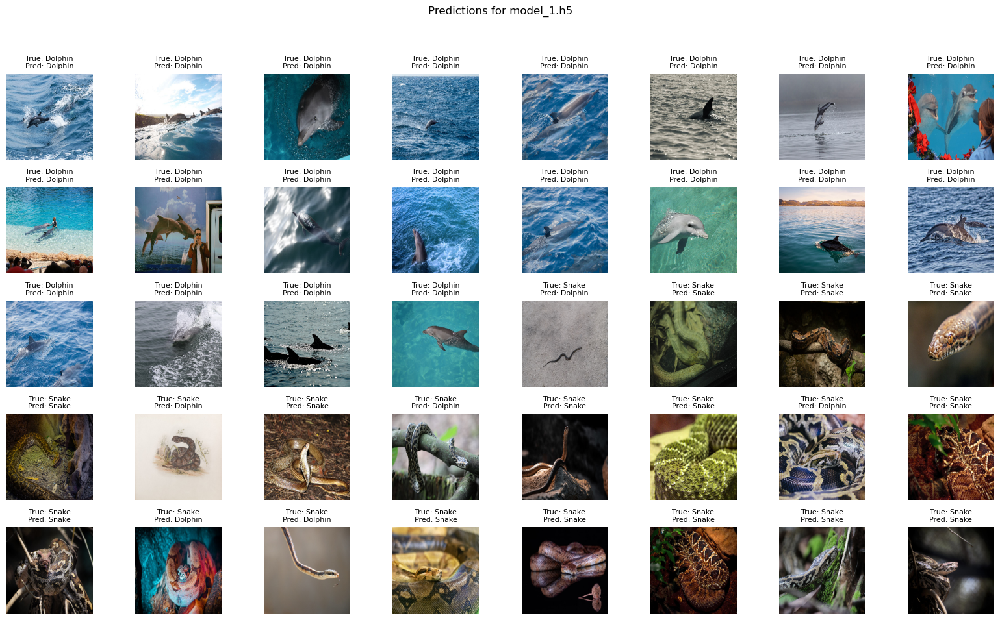

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

def load_and_predict_single_model(model_path, test_dir,size):
    # Load the saved model
    model = tf.keras.models.load_model(model_path)
    print(f"Loaded model: {model_path}")
    
    # Create data generator for the test set
    datagen = ImageDataGenerator(rescale=1.0/255.0)
    test_it = datagen.flow_from_directory(
        test_dir,
        class_mode='binary',
        batch_size=1,  # Set batch size to 1 for individual predictions
        target_size=(size, size),
        shuffle=False  # Keep images in order for consistent predictions
    )
    
    # Make predictions
    predictions = model.predict(test_it, steps=len(test_it), verbose=0)
    predicted_classes = (predictions > 0.5).astype(int).flatten()  # Assuming binary classification
    
    # Plot and display predictions
    plt.figure(figsize=(16, 10))
    for i in range(len(test_it.filenames)):
        plt.subplot(5, 8, i + 1)  # Adjust grid size if needed
        plt.imshow(test_it[i][0][0])  # Display the image
        
        # Get true and predicted labels
        true_label = 'Dolphin' if test_it[i][1][0] == 0 else 'Snake'
        pred_label = 'Dolphin' if predicted_classes[i] == 0 else 'Snake'
        
        # Set title with prediction result
        plt.title(f'True: {true_label}\nPred: {pred_label}', fontsize=8)
        plt.axis('off')
    
    plt.suptitle(f"Predictions for {model_path}")
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust layout to fit title
    plt.show()

# Path to the saved model
model_path = "model_1.h5"

# Directory containing test images
test_dir = 'dataset/test/'

# Run predictions for the model
load_and_predict_single_model(model_path, test_dir,200)


Loaded model: model_2.h5
Found 40 images belonging to 2 classes.


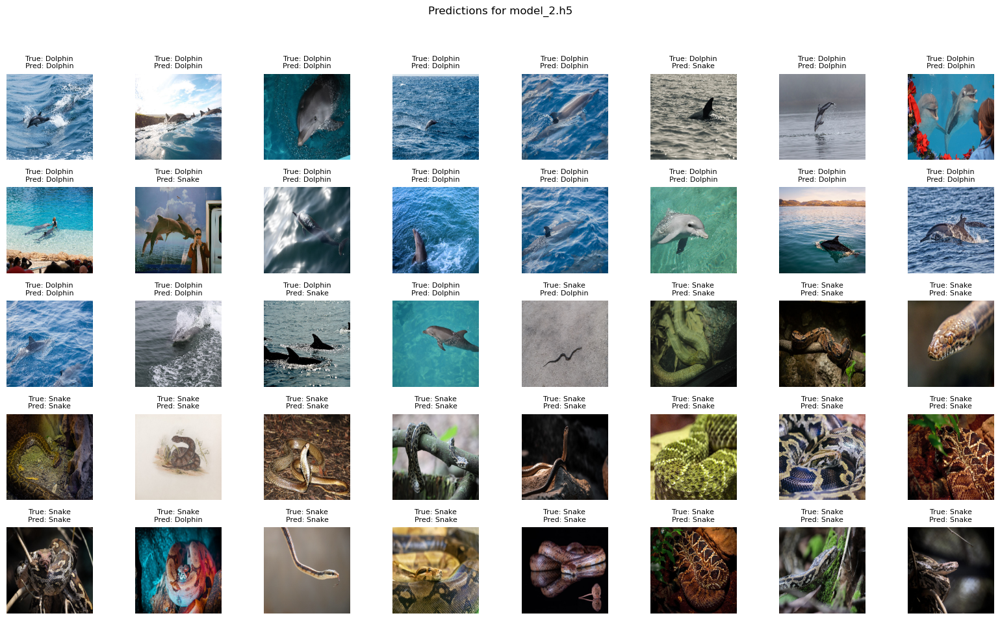

In [ ]:
model_path = "model_2.h5"
load_and_predict_single_model(model_path, test_dir,200)


Loaded model: model_3.h5
Found 40 images belonging to 2 classes.


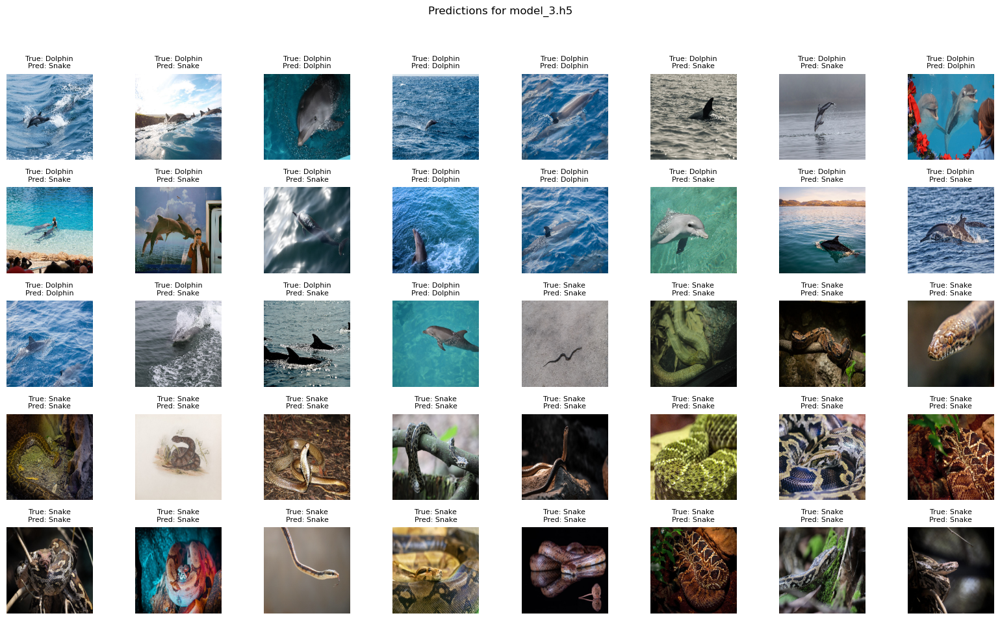

In [ ]:
model_path = "model_3.h5"
load_and_predict_single_model(model_path, test_dir,200)


Loaded model: model_4.h5
Found 40 images belonging to 2 classes.


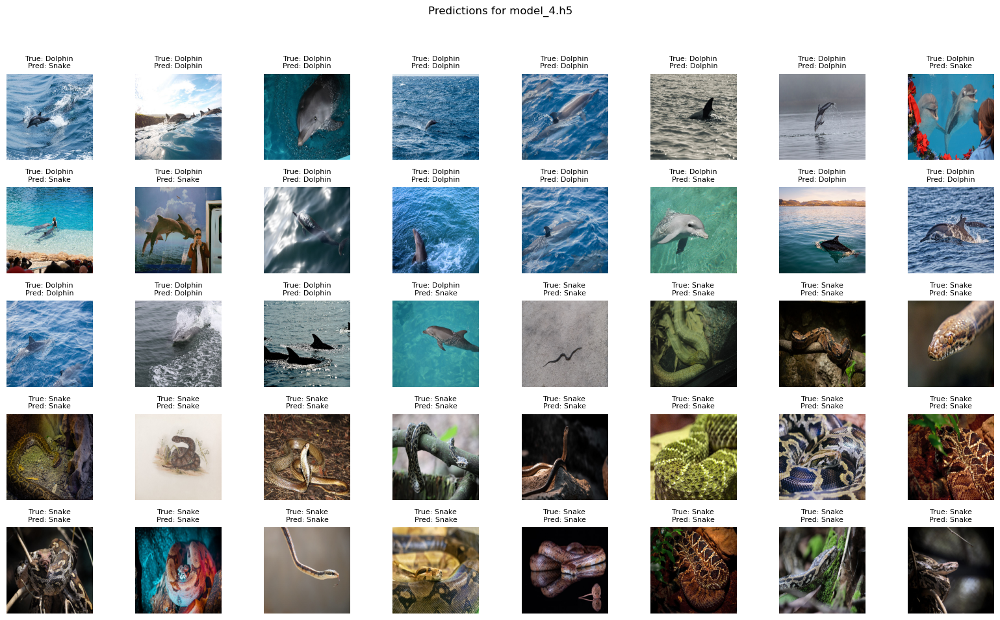

In [ ]:
model_path = "model_4.h5"
load_and_predict_single_model(model_path, test_dir,224)


Loaded model: model_5.h5
Found 40 images belonging to 2 classes.


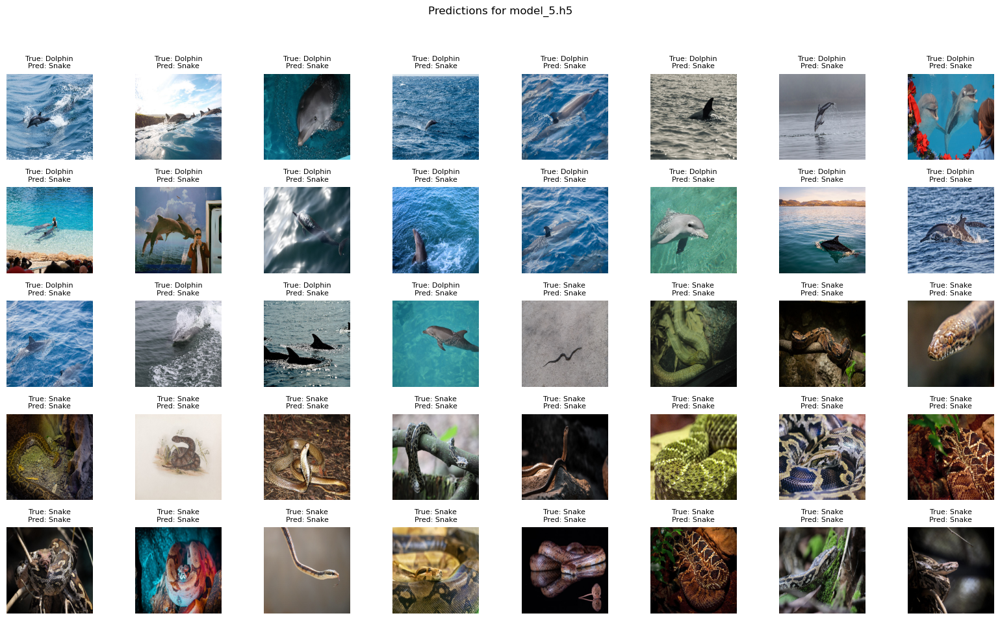

In [ ]:
model_path = "model_5.h5"
load_and_predict_single_model(model_path, test_dir,224)


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import numpy as np


In [ ]:
# Define transformations
transform = transforms.Compose([
    transforms.Resize((200, 200)),  # Resize images to 200x200
    transforms.ToTensor(),          # Convert image to PyTorch tensor
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])  # Normalize with ImageNet mean and std
])

# Load datasets
train_dataset = datasets.ImageFolder(root='dataset/train', transform=transform)
test_dataset = datasets.ImageFolder(root='dataset/test', transform=transform)

# Create data loaders
train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False)
class MLP(nn.Module):
    def __init__(self):
        super(MLP, self).__init__()
        self.Layer1 = nn.Linear(3 * 200 * 200, 1024)
        self.Layer2 = nn.Linear(1024, 512)
        self.Layer3 = nn.Linear(512, 256)
        self.Layer4 = nn.Linear(256, 128)
        self.Layer5 = nn.Linear(128, 64)
        self.Layer6 = nn.Linear(64, 32)
        self.Layer7 = nn.Linear(32, 16)
        self.Layer8 = nn.Linear(16, 2)  # Two outputs for binary classification

    def forward(self, x):
        x = x.view(-1, 3 * 200 * 200)  # Flatten the input
        x = F.leaky_relu(self.Layer1(x))
        x = F.leaky_relu(self.Layer2(x))
        x = F.leaky_relu(self.Layer3(x))
        x = F.leaky_relu(self.Layer4(x))
        x = F.leaky_relu(self.Layer5(x))
        x = F.leaky_relu(self.Layer6(x))
        x = F.leaky_relu(self.Layer7(x))
        x = self.Layer8(x)
        return F.log_softmax(x, dim=1)  # Log-softmax for binary classification


In [ ]:
# Initialize model, loss, and optimizer
model = MLP()
criterion = nn.CrossEntropyLoss()  # Use CrossEntropy for log-softmax outputs
optimizer = optim.Adam(model.parameters(), lr=0.001)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)


MLP(
  (Layer1): Linear(in_features=120000, out_features=1024, bias=True)
  (Layer2): Linear(in_features=1024, out_features=512, bias=True)
  (Layer3): Linear(in_features=512, out_features=256, bias=True)
  (Layer4): Linear(in_features=256, out_features=128, bias=True)
  (Layer5): Linear(in_features=128, out_features=64, bias=True)
  (Layer6): Linear(in_features=64, out_features=32, bias=True)
  (Layer7): Linear(in_features=32, out_features=16, bias=True)
  (Layer8): Linear(in_features=16, out_features=2, bias=True)
)

In [ ]:
import time

# Modified train function to calculate training accuracy
def train(model, train_loader, criterion, optimizer, device):
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0
    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        
        # Zero the parameter gradients
        optimizer.zero_grad()
        
        # Forward pass
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        
        # Backward pass and optimization
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item() * inputs.size(0)
        
        # Calculate training accuracy
        _, predicted = torch.max(outputs, 1)
        correct += (predicted == labels).sum().item()
        total += labels.size(0)
    
    epoch_loss = running_loss / len(train_loader.dataset)
    accuracy = correct / total
    return epoch_loss, accuracy

# Evaluation function remains the same
def evaluate(model, test_loader, criterion, device):
    model.eval()
    running_loss = 0.0
    correct = 0
    with torch.no_grad():
        for inputs, labels in test_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            
            # Forward pass
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            running_loss += loss.item() * inputs.size(0)
            
            # Calculate accuracy
            _, predicted = torch.max(outputs, 1)
            correct += (predicted == labels).sum().item()
            
    epoch_loss = running_loss / len(test_loader.dataset)
    accuracy = correct / len(test_loader.dataset)
    return epoch_loss, accuracy

# Initialize accumulators for average metrics and total time
total_train_loss = 0.0
total_train_accuracy = 0.0
total_test_loss = 0.0
total_test_accuracy = 0.0
total_training_time = 0.0

# Set number of epochs
num_epochs = 5

# Train and evaluate
for epoch in range(num_epochs):
    start_time = time.time()  # Start timer
    
    # Training
    train_loss, train_accuracy = train(model, train_loader, criterion, optimizer, device)
    total_train_loss += train_loss
    total_train_accuracy += train_accuracy
    
    # Evaluation
    test_loss, test_accuracy = evaluate(model, test_loader, criterion, device)
    total_test_loss += test_loss
    total_test_accuracy += test_accuracy
    
    # End timer and calculate epoch duration
    epoch_time = time.time() - start_time
    total_training_time += epoch_time
    
    print(f'Epoch {epoch+1}/{num_epochs}, Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.4f}, '
          f'Test Loss: {test_loss:.4f}, Test Accuracy: {test_accuracy:.4f}, Time: {epoch_time:.2f}s')
    
    # Save the model at the last epoch
    if epoch == num_epochs - 1:
        model_filename = "model_mlp.h5"
        torch.save(model.state_dict(), model_filename)

# Calculate average metrics
avg_train_loss = total_train_loss / num_epochs
avg_train_accuracy = total_train_accuracy / num_epochs
avg_test_loss = total_test_loss / num_epochs
avg_test_accuracy = total_test_accuracy / num_epochs
training_time = total_training_time

# Print average metrics
print(f"\nAverage Training Loss: {avg_train_loss:.4f}")
print(f"Average Training Accuracy: {(avg_train_accuracy)*100}")
print(f"Average Testing Loss: {avg_test_loss:.4f}")
print(f"Average Testing Accuracy: {avg_test_accuracy*100}")
print(f"Training Time: {training_time:.2f}s")


Epoch 1/5, Train Loss: 0.6255, Train Accuracy: 0.6000, Test Loss: 0.1856, Test Accuracy: 0.8750, Time: 7.36s
Epoch 2/5, Train Loss: 0.2667, Train Accuracy: 0.9313, Test Loss: 0.5389, Test Accuracy: 0.9250, Time: 6.09s
Epoch 3/5, Train Loss: 0.5071, Train Accuracy: 0.9125, Test Loss: 0.2587, Test Accuracy: 0.9000, Time: 6.21s
Epoch 4/5, Train Loss: 0.1708, Train Accuracy: 0.9625, Test Loss: 0.1679, Test Accuracy: 0.9250, Time: 5.99s
Epoch 5/5, Train Loss: 0.1393, Train Accuracy: 0.9250, Test Loss: 0.1459, Test Accuracy: 0.9000, Time: 6.16s

Average Training Loss: 0.3419
Average Training Accuracy: 86.625
Average Testing Loss: 0.2594
Average Testing Accuracy: 90.5
Training Time: 31.80s


Loaded model from: model_mlp.h5


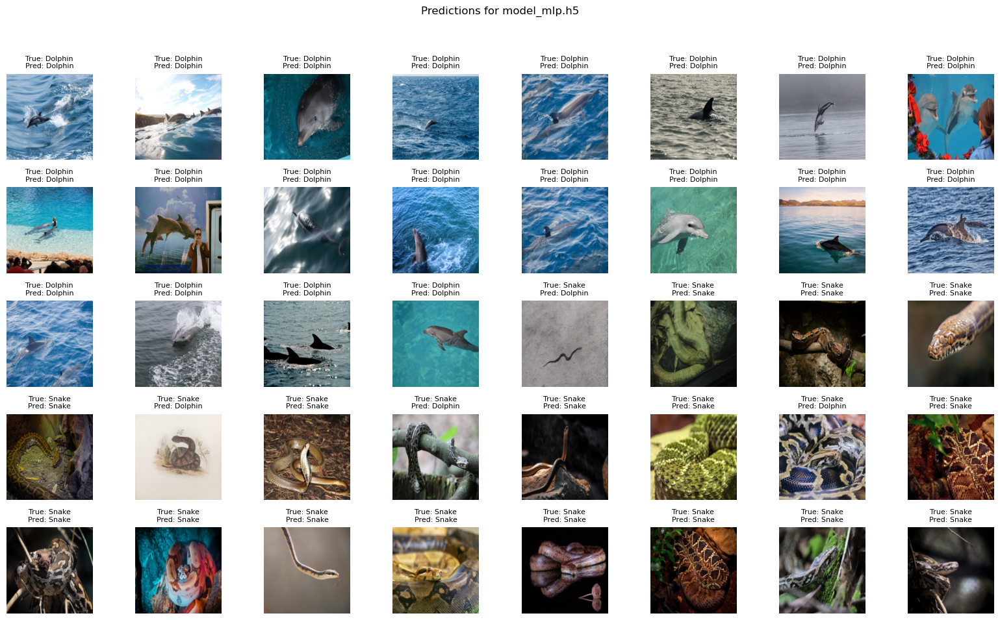

In [ ]:
import os
import torch
from torch import nn
from torch.utils.data import DataLoader
from torchvision import transforms, datasets
import matplotlib.pyplot as plt
def load_and_predict_pytorch_model(model_path, test_dir, size=200):
    # Load the saved model
    model = MLP()
    model.load_state_dict(torch.load(model_path))
    model.eval()  # Set to evaluation mode
    print(f"Loaded model from: {model_path}")
    
    # Load test dataset
    test_dataset = datasets.ImageFolder(root=test_dir, transform=transform)
    test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)
    
    # Prepare for prediction display
    plt.figure(figsize=(16, 10))
    
    # Loop through the test dataset
    for i, (images, labels) in enumerate(test_loader):
        # Predict using the model
        with torch.no_grad():
            output = model(images)
            pred_class = output.argmax(dim=1).item()  # Get the predicted class (0 or 1)
        
        # Display the image
        img_np = images[0].numpy().transpose((1, 2, 0))  # Change from (C, H, W) to (H, W, C)
        img_np = np.clip((img_np * [0.229, 0.224, 0.225]) + [0.485, 0.456, 0.406], 0, 1)
        plt.subplot(5, 8, i + 1)  # Adjust grid size if needed
        plt.imshow(img_np)
        
        # Determine the true and predicted labels
        true_label = 'Dolphin' if labels.item() == 0 else 'Snake'
        pred_label = 'Dolphin' if pred_class == 0 else 'Snake'
        
        # Set title with prediction result
        plt.title(f'True: {true_label}\nPred: {pred_label}', fontsize=8)
        plt.axis('off')
    
    plt.suptitle(f"Predictions for {model_path}")
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust layout to fit title
    plt.show()

# Path to the saved model
model_path = "model_mlp.h5"  # Ensure this path and file format match your saved model

# Directory containing test images
test_dir = 'dataset/test/'  # Use the correct test directory path

# Run pr  edictions for the model
load_and_predict_pytorch_model(model_path, test_dir)


Loaded model: model_1.h5


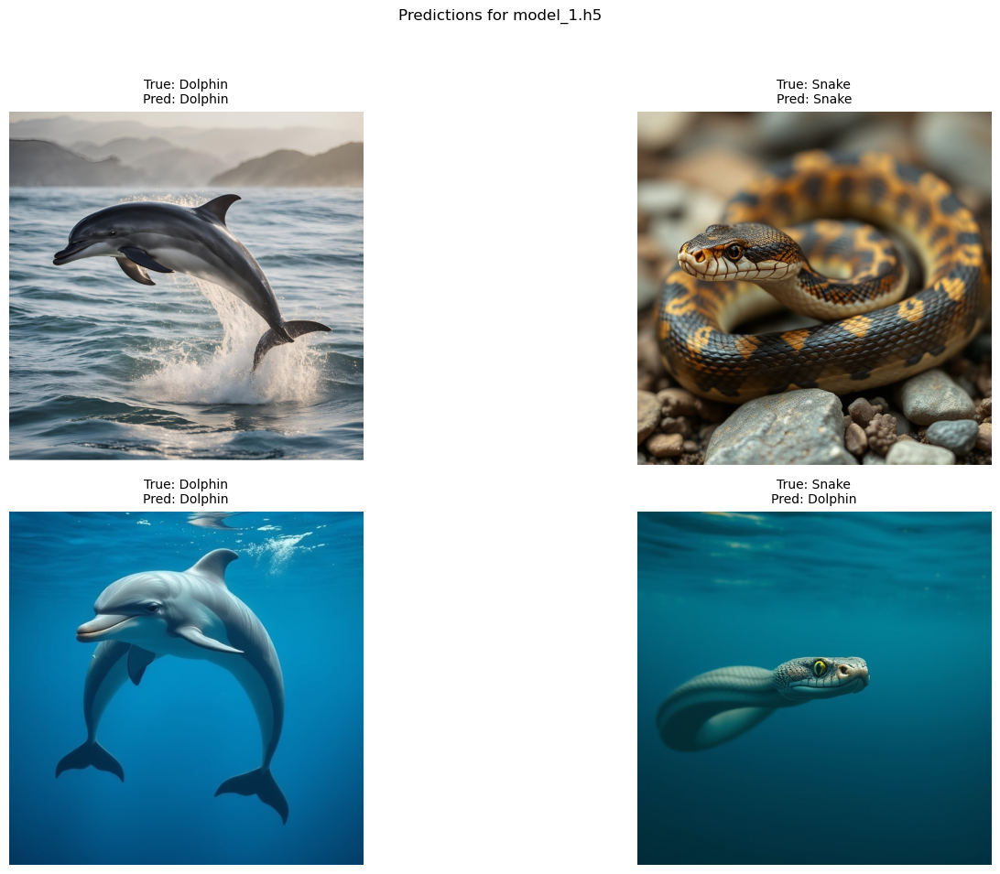

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator

def load_and_predict_single_model(model_path, test_dir, size):
    # Load the saved model
    model = tf.keras.models.load_model(model_path)
    print(f"Loaded model: {model_path}")
    
    # Get list of images in the test_dir
    image_names = [f for f in os.listdir(test_dir) if f.endswith(('.jpg', '.jpeg', '.png'))]
    
    # Create an ImageDataGenerator instance for preprocessing the images
    datagen = ImageDataGenerator(rescale=1.0/255.0)
    
    # Prepare images and make predictions
    images = []
    for image_name in image_names:
        img_path = os.path.join(test_dir, image_name)
        img = image.load_img(img_path, target_size=(size, size))  # Load and resize image
        img_array = image.img_to_array(img)  # Convert to numpy array
        img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
        img_array = datagen.standardize(img_array)  # Apply rescaling
        
        images.append(img_array)
    
    # Stack all the images into a single array
    images = np.vstack(images)
    
    # Make predictions
    predictions = model.predict(images, verbose=0)
    predicted_classes = (predictions > 0.5).astype(int).flatten()  # Assuming binary classification
    
    # Plot and display predictions
    plt.figure(figsize=(16, 10))
    for i, image_name in enumerate(image_names):
        plt.subplot(2, 2, i + 1)  # Adjust grid size if needed
        img = image.load_img(os.path.join(test_dir, image_name))  # Reload original image
        plt.imshow(img)
        
        # Set title with prediction result
        true_label = 'Dolphin' if image_name.startswith('easy_dolphin') or image_name.startswith('hard_dolphin') else 'Snake'
        pred_label = 'Dolphin' if predicted_classes[i] == 0 else 'Snake'
        
        # Display labels
        plt.title(f'True: {true_label}\nPred: {pred_label}', fontsize=10)
        plt.axis('off')
    
    plt.suptitle(f"Predictions for {model_path}")
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust layout to fit title
    plt.show()

# Path to the saved model
model_path = "model_1.h5"

# Directory containing test images
test_dir = 'image_tool'

# Run predictions for the model
load_and_predict_single_model(model_path, test_dir, 200)


Loaded model: model_2.h5


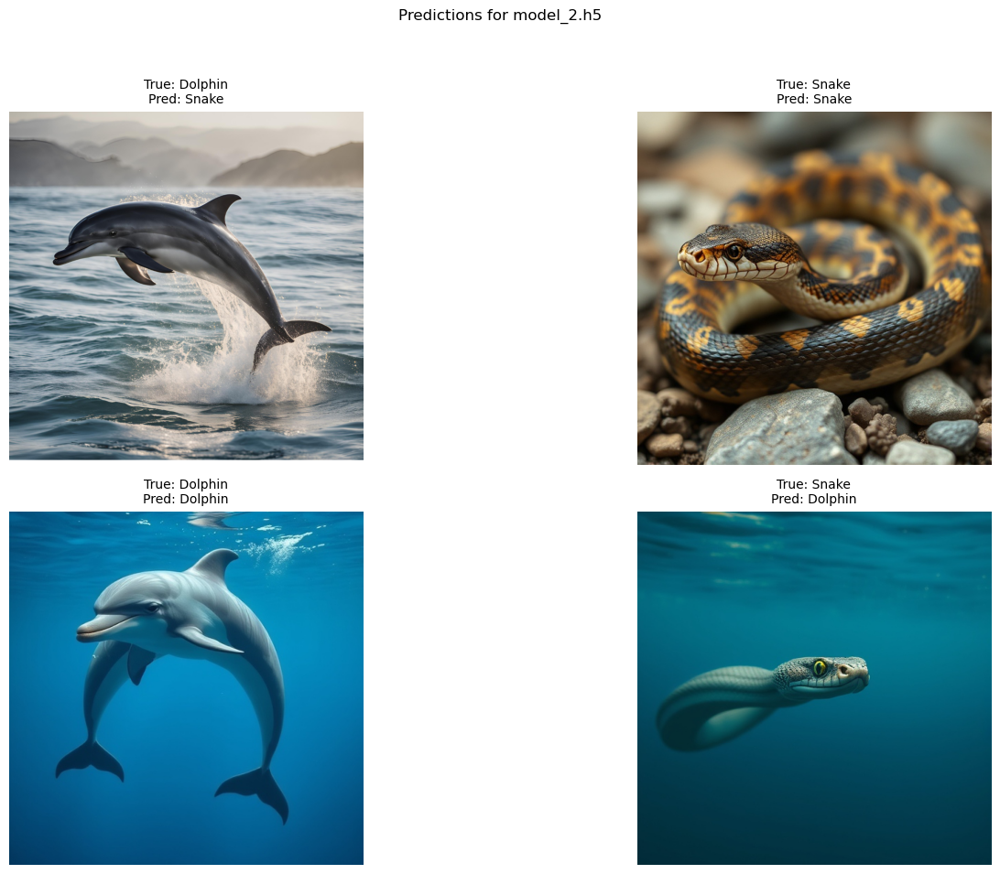

In [ ]:
model_path = "model_2.h5"
load_and_predict_single_model(model_path, test_dir, 200)

Loaded model: model_3.h5


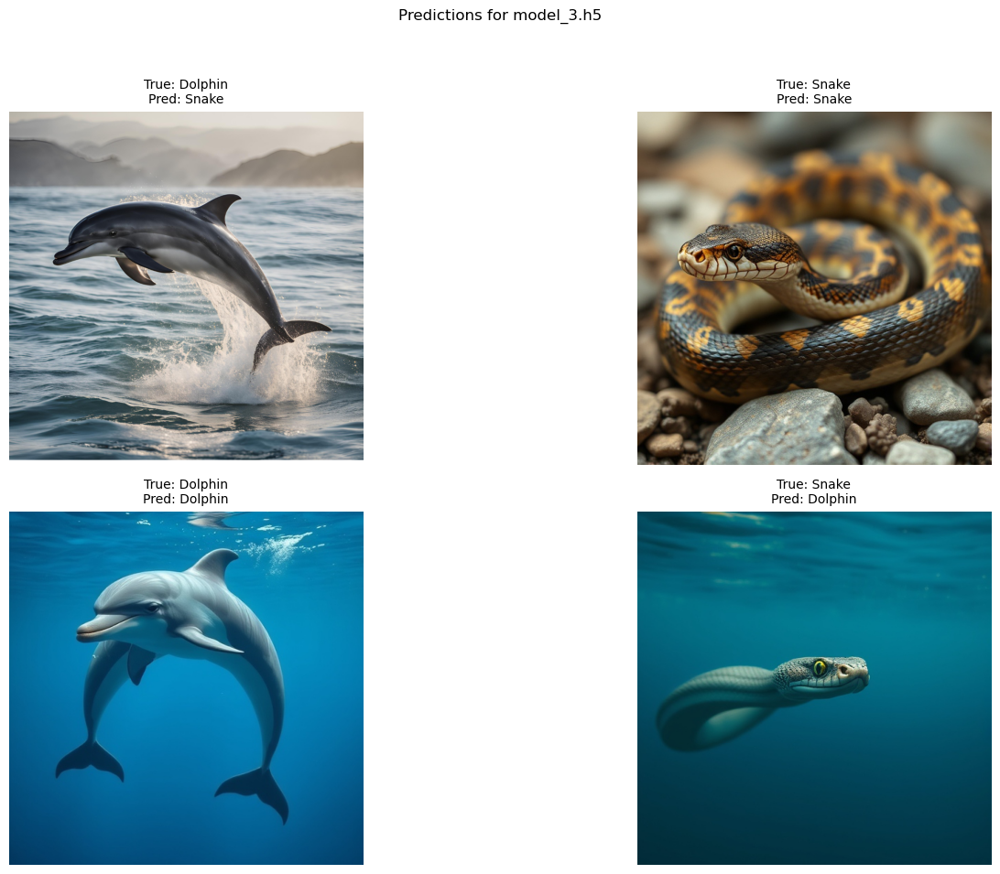

In [ ]:
model_path = "model_3.h5"
load_and_predict_single_model(model_path, test_dir, 200)

Loaded model: model_4.h5


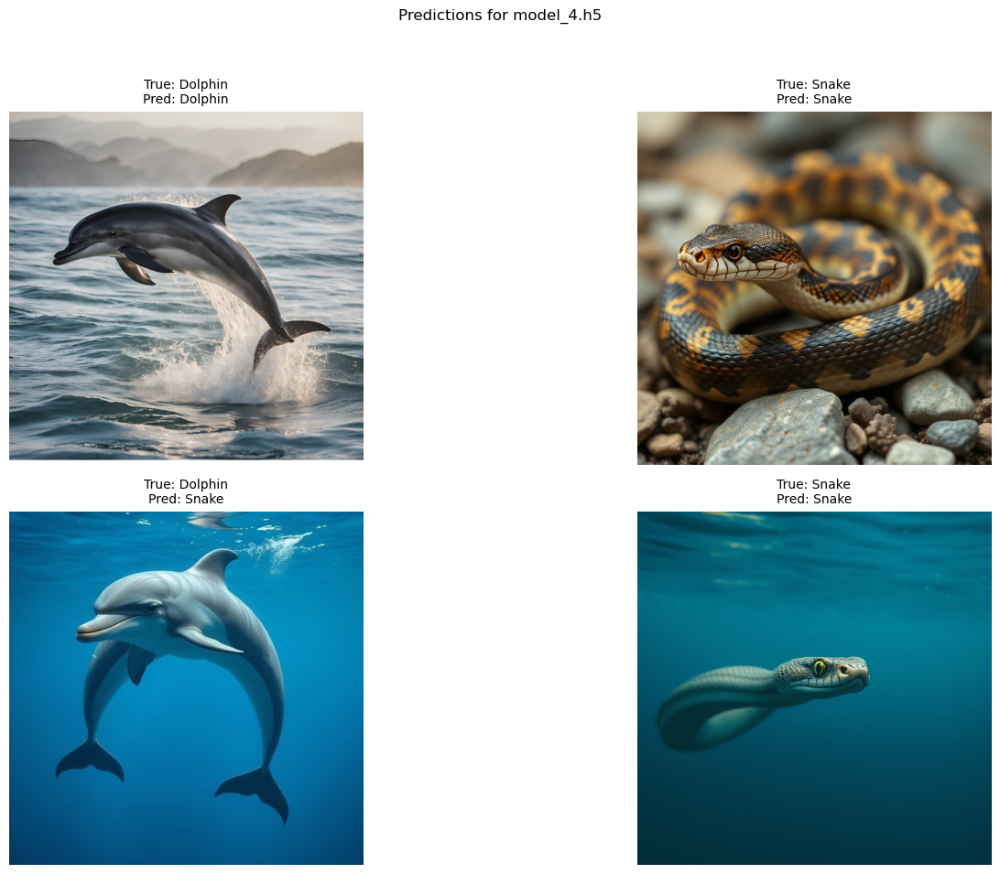

In [ ]:
model_path = "model_4.h5"
load_and_predict_single_model(model_path, test_dir, 224)

Loaded model: model_5.h5


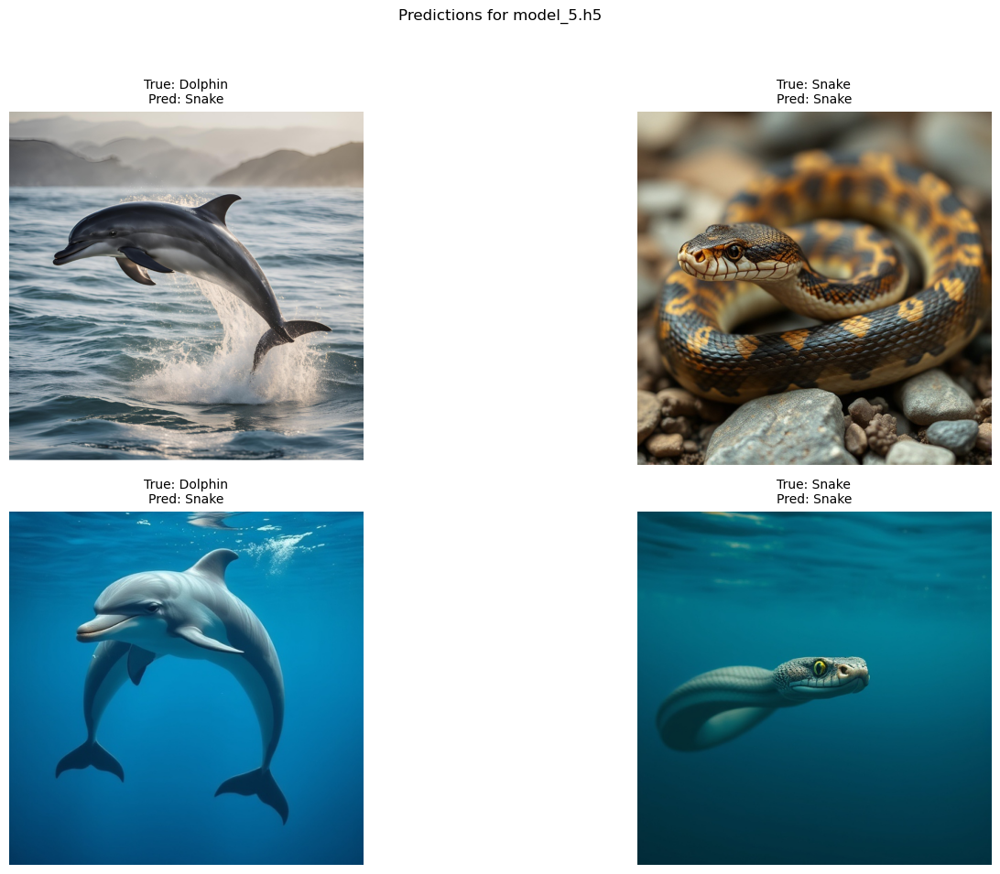

In [ ]:
model_path = "model_5.h5"
load_and_predict_single_model(model_path, test_dir, 224)

Loaded model from: model_mlp.h5


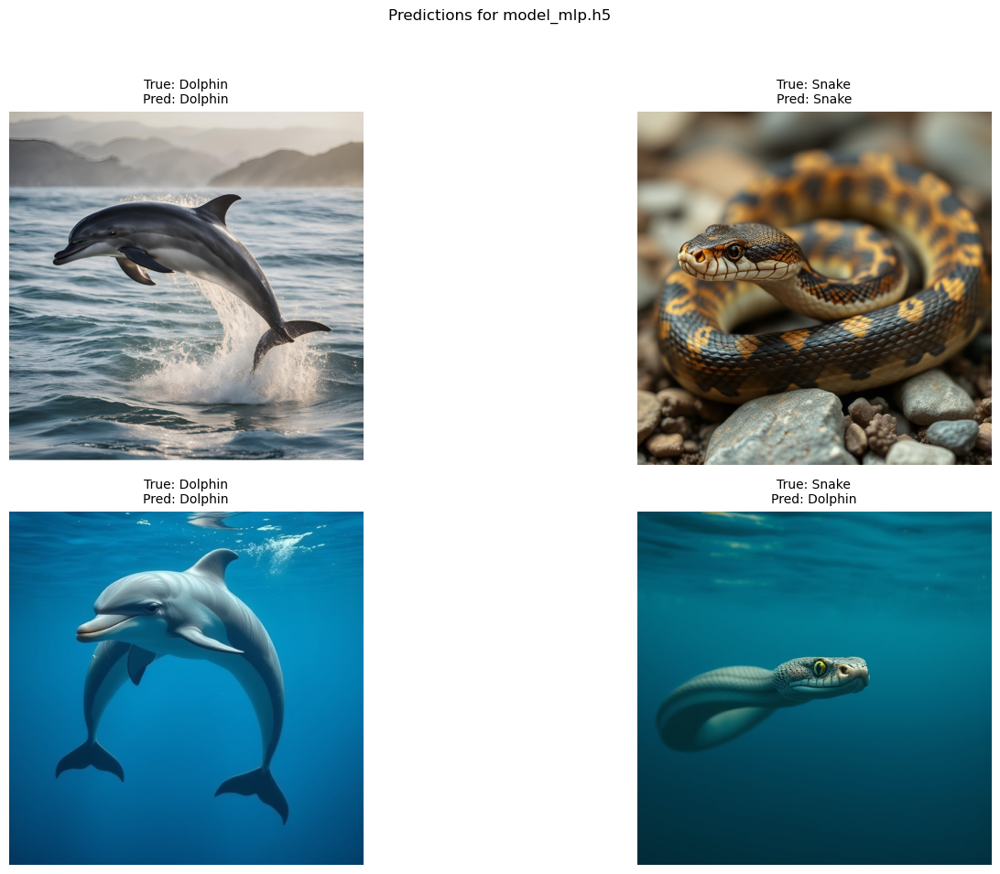

In [ ]:
def load_and_predict_pytorch_model(model_path, test_dir):
    # Load the saved model
    model = MLP()
    model.load_state_dict(torch.load(model_path))
    model.eval()  # Set to evaluation mode
    print(f"Loaded model from: {model_path}")

    # List of image files in the test directory
    image_names = [f for f in os.listdir(test_dir) if f.endswith(('.jpg', '.jpeg', '.png'))]
    images, predictions = [], []

    # Prepare and predict each image
    for image_name in image_names:
        img_path = os.path.join(test_dir, image_name)
        
        # Load image and apply transformations
        img = Image.open(img_path).convert("RGB")
        img_transformed = transform(img).unsqueeze(0)  # Add batch dimension

        # Predict using the model
        with torch.no_grad():
            output = model(img_transformed)
            pred_class = output.argmax(dim=1).item()  # Get the predicted class (0 or 1)

        # Store results for displaying
        images.append(img)
        predictions.append(pred_class)

    # Display predictions
    plt.figure(figsize=(16, 10))
    for i, (img, pred_class) in enumerate(zip(images, predictions)):
        plt.subplot(2, 2, i + 1)  # Adjust grid size if needed
        plt.imshow(img)
        
        # Set title with prediction result
        true_label = 'Dolphin' if image_names[i].startswith('easy_dolphin') or image_names[i].startswith('hard_dolphin') else 'Snake'
        pred_label = 'Dolphin' if pred_class == 0 else 'Snake'
        
        # Display labels
        plt.title(f'True: {true_label}\nPred: {pred_label}', fontsize=10)
        plt.axis('off')
    
    plt.suptitle(f"Predictions for {model_path}")
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust layout to fit title
    plt.show()

# Path to the saved model
model_path = "model_mlp.h5"  # Make sure this is the correct path and format for PyTorch

# Directory containing test images
test_dir = 'image_tool'

# Run predictions for the model
load_and_predict_pytorch_model(model_path, test_dir)